# Lunar Water Visualization
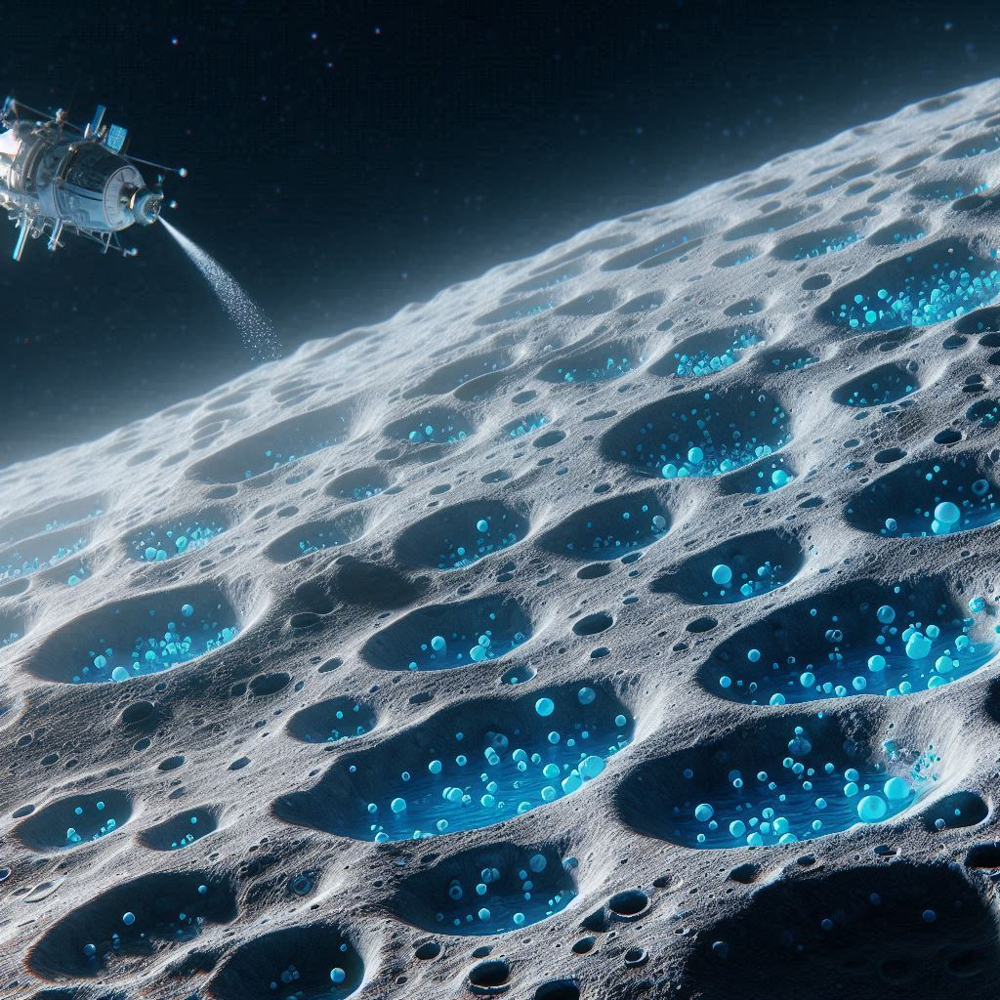
The Lunar Water Discovery project leverages satellite data from Chandrayaan missions to analyze and visualize water concentration on the Moon's surface. The project processes and aggregates multi-band spectral data in the form of .tif images, applies clustering algorithms, and visualizes the results.

Dataset : https://www.kaggle.com/datasets/yash92328/lunar-water-discovery

NOTE:
- A .tif (Tagged Image File Format) file is a widely used raster image format that stores data in a grid of pixels, often used for geospatial data like satellite images or lunar surface maps
- It contains multiple spectral bands that represent different wavelengths of electromagnetic radiation reflected from the Moon's surface. These bands help detect specific features, such as water content, on the lunar surface.





## About Chandrayaan-1
Launched on October 22, 2008, Chandrayaan-1 marked India's significant step into lunar exploration under the Indian Space Research Organisation (ISRO). The mission aimed to study the Moon's surface, mineral composition, and water-ice presence, as well as to map its topography. It orbited the Moon at an altitude of approximately 100 km, making significant contributions to lunar science until it lost communication on August 29, 2009.

**Objectives**
- High-resolution mapping of the lunar surface
- Chemical, mineralogical, and photogeological study of the Moon
- Exploration of water-ice in the Moon's polar regions
- Investigation of the Moon's exosphere


In [ ]:
pip install rasterio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 51.8 MB/s eta 0:00:00


## Import Neccessary Libaries


1. **NumPy**: Handles large datasets and performs mathematical operations on arrays, like normalizing and aggregating spectral band data.

2. **Rasterio**: Reads and processes geospatial raster data (e.g., `.tif` files), extracting pixel values for analysis.

3. **Matplotlib**: Creates static visualizations, such as heatmaps, to display water concentration data on the lunar surface.

4. **Plotly**: Generates interactive visualizations (e.g., 3D maps) for exploring water-rich and water-scarce regions on the Moon.

5. **scikit-learn (KMeans, MinMaxScaler)**:
   - **KMeans**: Clusters the lunar surface into water-rich and water-scarce areas.
   - **MinMaxScaler**: Normalizes data for consistent clustering and visualization.



In [ ]:
import numpy as np
import rasterio
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler


## Load and Process the Lunar Water Data

1. Load the .tif File: It loads the lunar data (e.g., from Chandrayaan) using rasterio, reading all spectral bands and the metadata.
2. Aggregate the Bands: It computes the mean of all bands to create a single map that represents the overall water concentration across the lunar surface.
3. Normalize the Data: The aggregated map is normalized to a range of 0 to 1 using MinMax scaling, improving the contrast and making it easier to visualize.
4. Visualize the Data: The normalized water concentration map is displayed using a 'viridis' colormap, with a color bar indicating the concentration levels.










/usr/local/lib/python3.10/dist-packages/rasterio/__init__.py:356: NotGeoreferencedWarning:

Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.



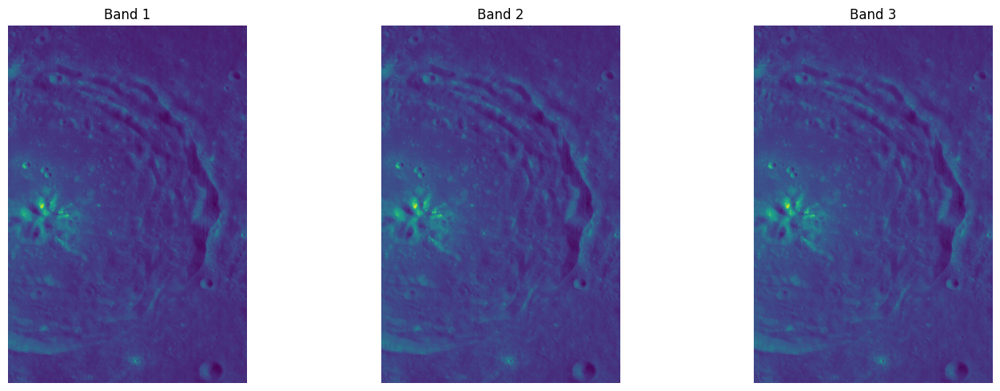

Dataset Metadata: {'driver': 'GTiff', 'dtype': 'float32', 'nodata': None, 'width': 304, 'height': 456, 'count': 83, 'crs': None, 'transform': Affine(1.0, 0.0, 0.0,
       0.0, 1.0, 0.0)}
Shape of Data: (83, 456, 304) (Bands, Height, Width)


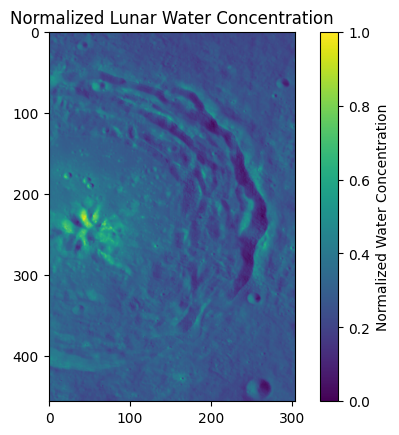

In [ ]:
#  Load the .tif file
tif_file_path = '/content/Bullialdus_m3_tiff.tif'
with rasterio.open(tif_file_path) as src:

    all_bands = src.read()  # Shape will be (bands, height, width)
    metadata = src.meta

#  Visualize the first few bands
def visualize_bands(data, band_indices):
    fig, axes = plt.subplots(1, len(band_indices), figsize=(15, 5))
    for i, band_idx in enumerate(band_indices):
        band = data[band_idx]
        normalized_band = (band - band.min()) / (band.max() - band.min())
        axes[i].imshow(normalized_band, cmap='viridis')
        axes[i].set_title(f'Band {band_idx + 1}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Visualize bands 1, 2, 3
visualize_bands(all_bands, [0, 1, 2])

#  Aggregate the bands (using mean aggregation)
aggregate_map = np.mean(all_bands, axis=0)
#  Normalize the Data
scaler = MinMaxScaler(feature_range=(0, 1))
normalized_aggregate = scaler.fit_transform(aggregate_map.reshape(-1, 1)).reshape(aggregate_map.shape)

# Visualize the Result
print("Dataset Metadata:", metadata)
print(f"Shape of Data: {all_bands.shape} (Bands, Height, Width)")
plt.imshow(normalized_aggregate, cmap='viridis')
plt.colorbar(label="Normalized Water Concentration")
plt.title("Normalized Lunar Water Concentration")
plt.show()


### Highlight Potential Water Areas

1. Defining a Threshold: It calculates the 75th percentile of the aggregated water concentration map to set a threshold. Areas with values above or equal to this threshold are considered potential water-rich regions.
2. Creating a Mask: A binary mask (water_mask) is generated, where pixels representing potential water-rich areas are marked as True.
3. Visualization: The mask is displayed using a 'Blues' colormap, highlighting the regions of interest with an alpha transparency for better visualization.



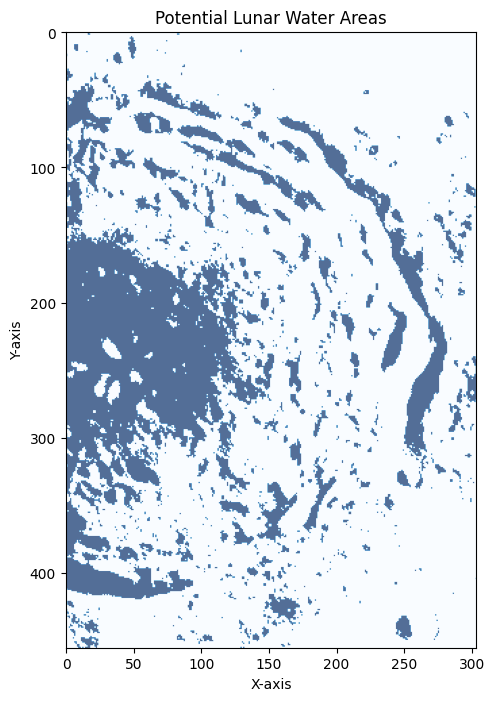

In [ ]:
# Define a threshold to highlight areas (example threshold: 75th percentile)
threshold = np.percentile(aggregate_map, 75)
water_mask = aggregate_map >= threshold

# Visualization
plt.figure(figsize=(10, 8))
plt.imshow(water_mask, cmap='Blues', alpha=0.7)
plt.title("Potential Lunar Water Areas")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()

### Spectral Analysis
- Spectral Analysis are crucial techniques in remote sensing used to analyze the characteristics of Earth’s surface or other celestial bodies over time or across different wavelengths of light.
- In the Lunar Water Discovery project, spectral bands from the Chandrayaan missions are analyzed. These bands capture information about various surface features, including water concentrations. The aggregation of these bands helps generate a clearer representation of the water content across the Moon’s surface.

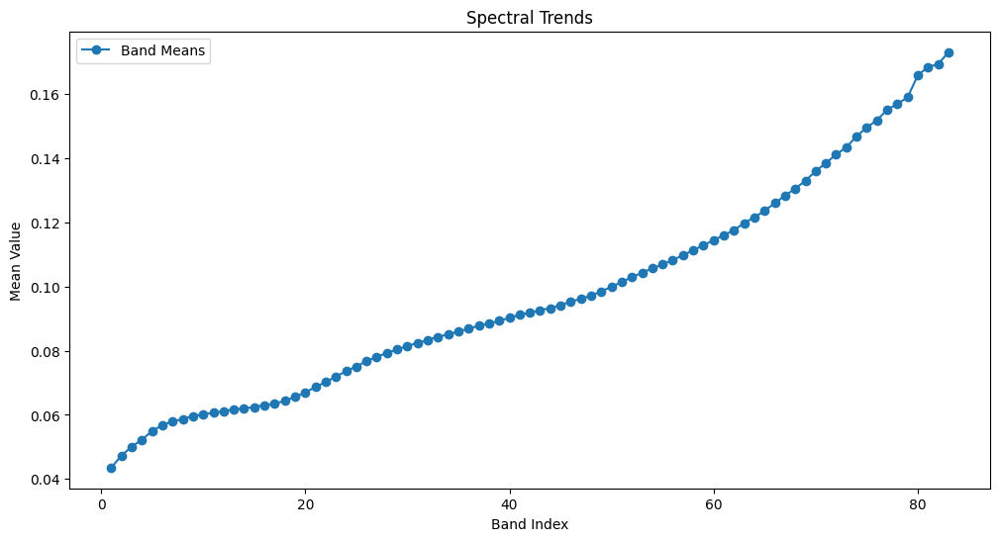

In [ ]:
# Analyze temporal trends by computing statistics for each band
band_means = [np.mean(all_bands[i]) for i in range(all_bands.shape[0])]

plt.figure(figsize=(12, 6))
plt.plot(range(1, all_bands.shape[0] + 1), band_means, marker='o', label="Band Means")
plt.title("Spectral Trends")
plt.xlabel("Band Index")
plt.ylabel("Mean Value")
plt.legend()
plt.show()

- X-axis (Band Index): This axis represents the index of the different spectral bands from the dataset. Spectral bands are typically associated with specific wavelengths of light captured by a sensor, which can correspond to different features on the lunar surface.

- Y-axis (Mean Value): This axis represents the mean value of the reflectance or intensity for each spectral band. A higher mean value generally indicates a stronger reflection in that band, which could correspond to features like water or minerals on the surface of the Moon.



## Apply K-Means Clustering to Identify Water-Rich and Water-Scarce Regions

The code applies K-Means clustering to identify and classify regions on the Moon's surface as water-rich or water-scarce based on the normalized water concentration data.

1. Prepare Data: The 2D grid of water concentration values is flattened into a 1D array, with the pixel coordinates and water concentration combined into a feature set for clustering.
2. K-Means Clustering: The K-Means algorithm is used to cluster the data into two groups (water-rich and water-scarce regions) based on water concentration values.
3. Reshape Labels: The resulting cluster labels are reshaped back into a 2D map to match the original spatial layout.
4. Visualization: The clustered map is visualized using a heatmap with an overlay showing the water-rich and water-scarce regions. A lunar surface texture is added for context.



In [ ]:

# Flatten the 2D array into a 1D array for clustering
x_coords, y_coords = np.meshgrid(np.arange(normalized_aggregate.shape[1]),
                                 np.arange(normalized_aggregate.shape[0]))
features = np.column_stack((x_coords.ravel(), y_coords.ravel(), normalized_aggregate.ravel()))  # Coordinates and water concentration

#  Apply K-Means Clustering
kmeans = KMeans(n_clusters=2, random_state=42)
labels = kmeans.fit_predict(features[:, 2].reshape(-1, 1))  # Using only water concentration for clustering

# SReshape the cluster labels back to the 2D grid shape
clustered_map = labels.reshape(normalized_aggregate.shape)

# Visualize the Clustered Lunar Surface
fig = go.Figure()

# Add Heatmap for Water Concentration
fig.add_trace(go.Heatmap(
    z=normalized_aggregate,
    x=x_coords[0, :],
    y=y_coords[:, 0],
    colorscale="Viridis",
   # colorbar=dict(title="Water Concentration"),
    zsmooth="best"
))

# Add Overlay for Clusters
fig.add_trace(go.Heatmap(
    z=clustered_map,
    x=x_coords[0, :],
    y=y_coords[:, 0],
    colorscale="Blues",
    opacity=0.5,
    colorbar=dict(title="Cluster", tickvals=[0, 1], ticktext=["Water-Scarce", "Water-Rich"])
))


fig.update_layout(
    title="Clustered Lunar Water Mapping",
    xaxis=dict(showgrid=False, zeroline=False),
    yaxis=dict(showgrid=False, zeroline=False),
    images=[dict(
        xref="paper", yref="paper",
        x=0, y=1, sizex=1, sizey=1,
        xanchor="left", yanchor="top", layer="below"
    )]
)

fig.show()


### 3D Lunar Mapping

1. Grid Creation: It generates X and Y coordinates based on the dimensions of the normalized water concentration map.
2. 3D Surface Plot: A surface plot is created using Plotly's go.Surface, where the Z-axis represents the water concentration, and the surface is colored using the 'Viridis' color scale.
3. Layout Customization: The plot is customized with a black background, no grid lines, and a specific camera angle for an optimal 3D view.
4. Interactive Visualization: The plot enables interactive exploration of the water concentration data on the lunar surface in 3D.










In [ ]:
# Create grid for the 3D plot
x = np.linspace(0, normalized_aggregate.shape[1], normalized_aggregate.shape[1])
y = np.linspace(0, normalized_aggregate.shape[0], normalized_aggregate.shape[0])
x, y = np.meshgrid(x, y)

#  Create a 3D Surface Plot
fig = go.Figure()

# Add the surface plot for lunar water data
fig.add_trace(
    go.Surface(
        z=normalized_aggregate,  # Elevation values
        x=x,  # Grid X
        y=y,  # Grid Y
        surfacecolor=normalized_aggregate,  # Data overlay
        colorscale="Viridis",
        colorbar=dict(title="Water Concentration")
    )
)

fig.update_layout(
    title="3D Lunar Water Mapping",
    scene=dict(
        xaxis=dict(showgrid=False, backgroundcolor="black"),
        yaxis=dict(showgrid=False, backgroundcolor="black"),
        zaxis=dict(showgrid=False, backgroundcolor="black"),
        aspectratio=dict(x=1, y=1, z=0.5)
    ),
    scene_camera=dict(eye=dict(x=1.5, y=1.5, z=1)),
)

# Show the figure
fig.show()


## Conclusion
The Lunar Water Discovery project successfully utilized spectral analysis, clustering algorithms, and data normalization techniques to gain insights into the distribution of water on the Moon’s surface. The project demonstrated that spectral data from the Chandrayaan mission could be effectively processed and visualized to identify regions with varying water concentrations, with water-rich areas found primarily near the poles and in shadowed craters.